# DALL·E

DALL·E is a sophisticated text-guided diffusion model built by [OpenAI](https://openai.com/). [DALL·E 3](https://openai.com/dall-e-3) is the latest version, and one that "understands significantly more nuance and detail than our previous systems, allowing you to easily translate your ideas into exceptionally accurate images." It can generate images from text prompts that you provide. Its predecessor, DALL·E 2, can create variations of existing images and perform inpainting and outpainting. (These features will probably come to DALL·E 3 soon.) Both models are available via REST APIs. Let's put them to work using Python.

Be sure to paste your OpenAI API key into the next cell in order to run the examples. If you don't already have an OpenAI account and an API key to go with it, go to https://platform.openai.com/signup and create an account. Then go to the API Keys page, generate an API key, and save it where you can easily retrieve it later. Once generated, an API key can't be retrieved by returning to the OpenAI Web site. Be sure to save it in a secure place so you can retrieve it when needed. If you lose an API key, your only recourse is to generate a new one.

In [1]:
from openai import OpenAI

client = OpenAI(api_key='API_KEY')

DALL·E is best known for its ability to generate images from scratch. Here's an example that uses DALL·E 3 to generate an image:

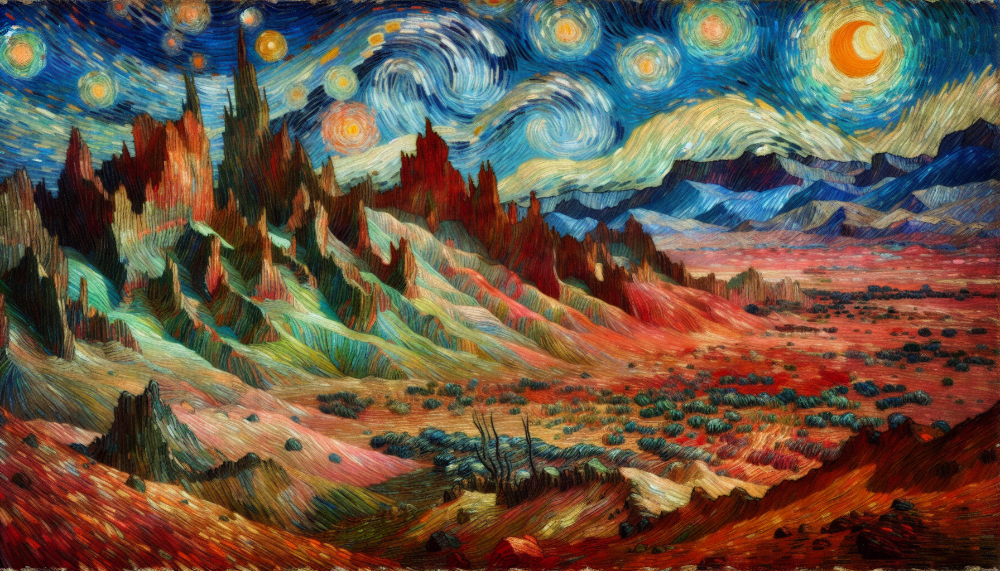

In [2]:
import base64, io
from PIL import Image

response = client.images.generate(
    prompt='Painting of a martian landscape in the style of van gogh',
    model='dall-e-3',
    size='1792x1024',
    response_format='b64_json'
)

image_data = response.data[0].b64_json
image = Image.open(io.BytesIO(base64.b64decode(image_data)))
display(image)

Here's another example. This time, rather than return an image in the response, DALL·E returns an image URL. Images created this way are stored for about an hour on the server, so if you want to retain the image, you need to download it.

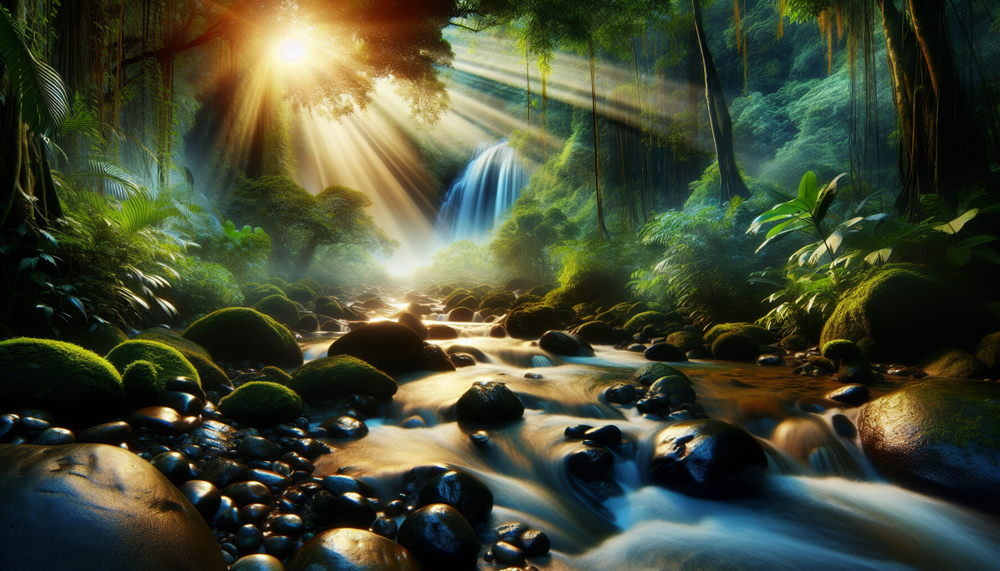

In [3]:
import requests

prompt = '''
    Photograph of a jungle stream with a waterfall in the background and
    rays of sunlight piercing the canopy
    '''

response = client.images.generate(
    prompt=prompt,
    model='dall-e-3',
    size='1792x1024'
)

image_url = response.data[0].url
image = Image.open(requests.get(image_url, stream=True).raw)
display(image)

DALL·E 2 can generate variations of existing images. Here's an example involving a photo taken in Wadi Rum, Jordan. First, the original photo:

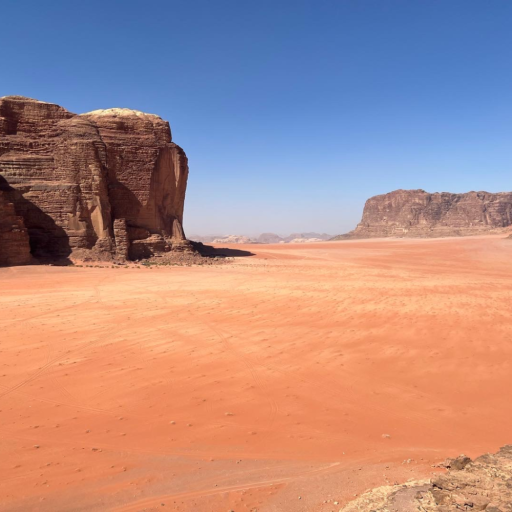

In [4]:
image = Image.open('Data/wadi-rum.png')
display(image)

And then, a variation created by DALL·E:

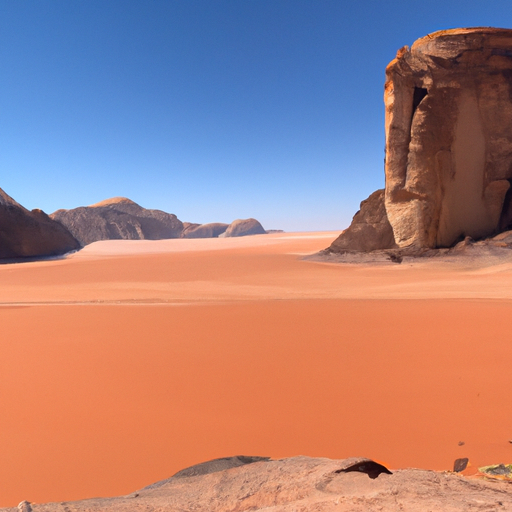

In [5]:
response = client.images.create_variation(
    image=open('Data/wadi-rum.png', 'rb'),
    size='512x512',
    response_format='b64_json'
)

image_data = response.data[0].b64_json
image = Image.open(io.BytesIO(base64.b64decode(image_data)))
display(image)

## Inpainting

DALL·E 2 can also perform *inpainting*, a common use for which is removing unwanted objects from images. Here's a photo of the pub in Richmond, England where the Apple TV+ series [Ted Lasso](https://en.wikipedia.org/wiki/Ted_Lasso) is filmed:

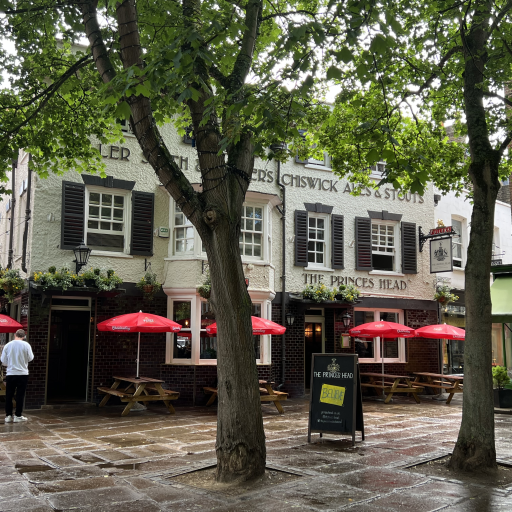

In [6]:
image = Image.open('Data/richmond.png')
display(image)

Inpainting uses a *mask* — an image containing transparent pixels — to determine which region(s) to inpaint. Here's the mask we'll use. Note that the person in the photo and the sign out front have been "erased" by being painted over with transparent pixels:

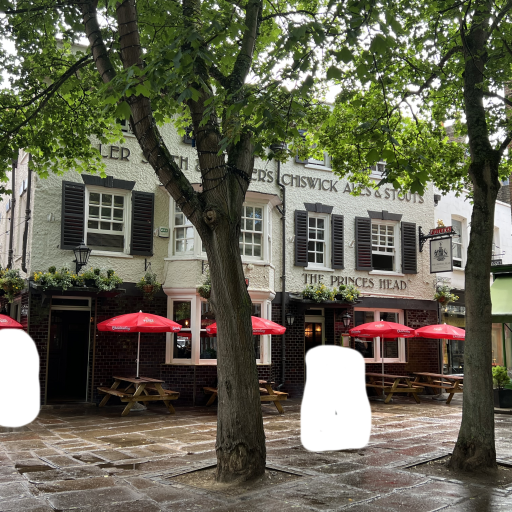

In [7]:
image = Image.open('Data/richmond-mask.png')
display(image)

Now let's submit the original image and the mask to DALL·E 2 to see if it can remove the person and the sign:

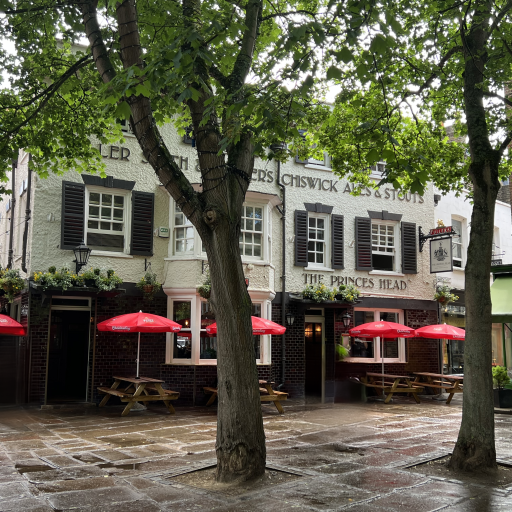

In [8]:
response = client.images.edit(
    image=open('Data/richmond.png', 'rb'),
    mask=open('Data/richmond-mask.png', 'rb'),
    prompt='Photograph of a pub in england',
    size='512x512',
    response_format='b64_json'
)

image_data = response.data[0].b64_json
image = Image.open(io.BytesIO(base64.b64decode(image_data)))
display(image)

Here's another example involving a picture of me and my wife taken in Iceland:

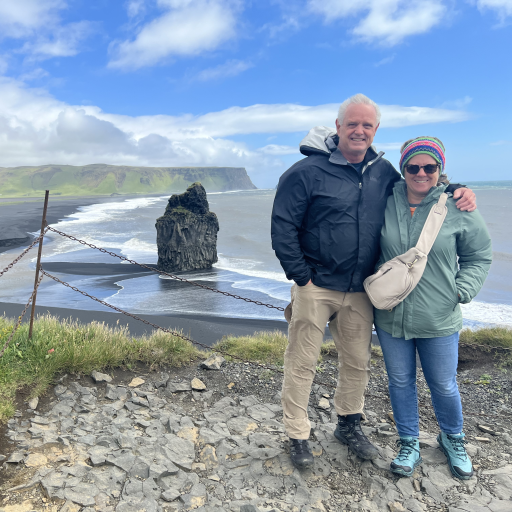

In [9]:
image = Image.open('Data/iceland.png')
display(image)

It's a good picture, but it's even better with the chain fence removed:

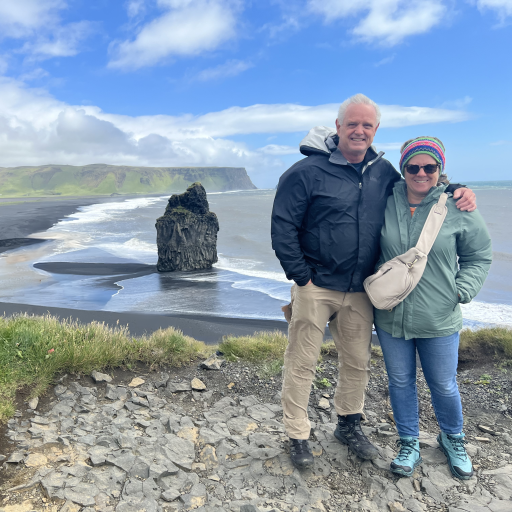

In [10]:
response = client.images.edit(
    image=open('Data/iceland.png', 'rb'),
    mask=open('Data/iceland-mask.png', 'rb'),
    prompt='Two people on a cliff overlooking a beach',
    size='512x512',
    response_format='b64_json'
)

image_data = response.data[0].b64_json
image = Image.open(io.BytesIO(base64.b64decode(image_data)))
display(image)

Here's a final example of inpainting involving the world's most famous painting. The background behind the Mona Lisa has been the subject of debate among art experts for many years. Of course, it's mostly obscured by the subject of the painting. Here's the original painting:

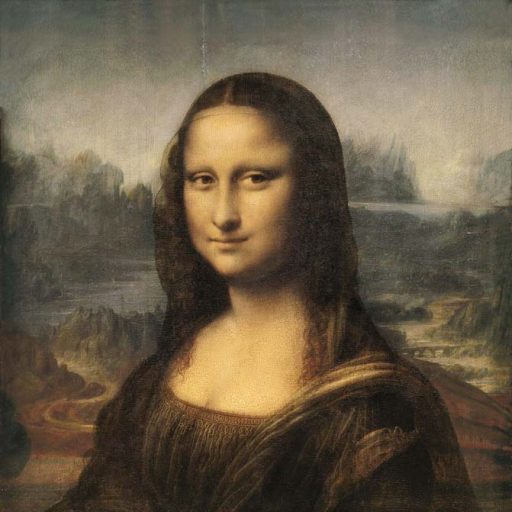

In [11]:
image = Image.open('Data/mona-lisa.png')
display(image)

Here's how DALL·E 2 imagines the painting would look with the subject removed:

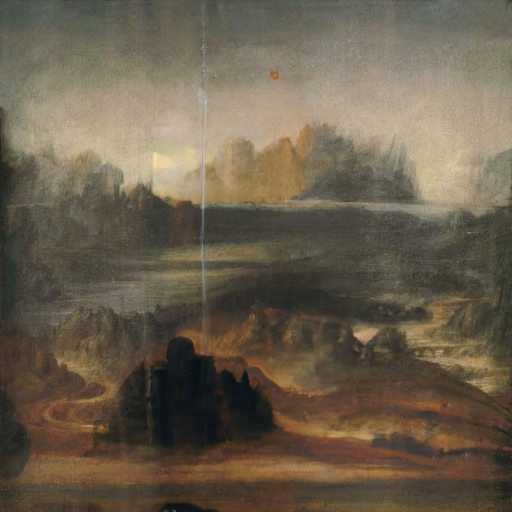

In [12]:
response = client.images.edit(
    image=open('Data/mona-lisa.png', 'rb'),
    mask=open('Data/mona-lisa-mask.png', 'rb'),
    prompt='Painting of a renaissance landscape',
    size='512x512',
    response_format='b64_json'
)

image_data = response.data[0].b64_json
image = Image.open(io.BytesIO(base64.b64decode(image_data)))
display(image)

## Outpainting

One of DALL·E 2's most remarkable talents is *outpainting*: extending an image to show how it might look on a larger canvas. Here's one of my favorite paintings of all time:

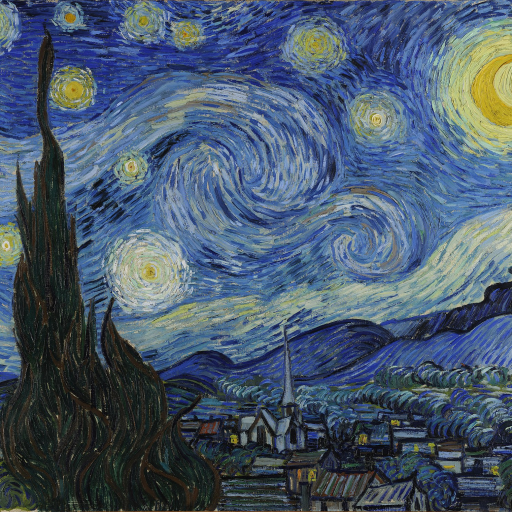

In [13]:
image = Image.open('Data/starry-night-512.png')
display(image)

How might Starry Night have looked had Van Gogh painted it on a larger canvas? Let's see what DALL·E 2 thinks:

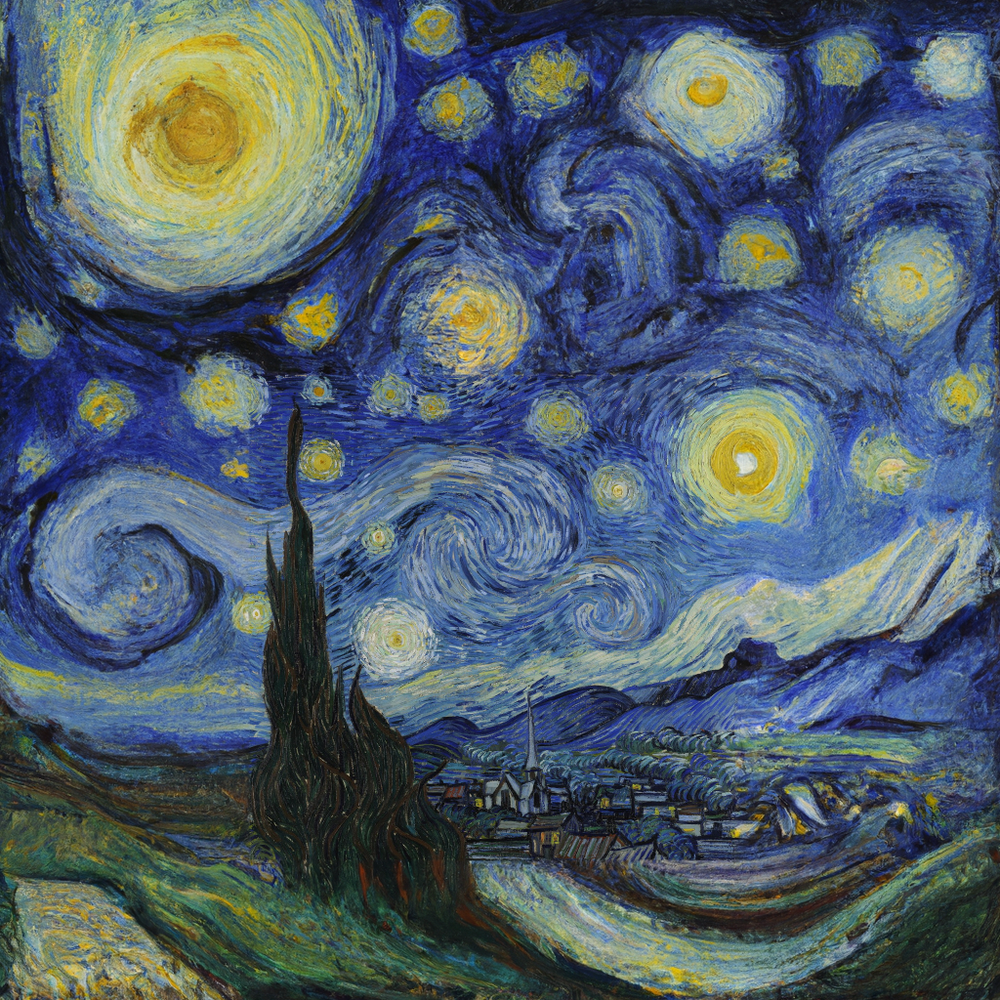

In [14]:
response = client.images.edit(
    image=open('Data/starry-night-mask-1024.png', 'rb'),
    mask=open('Data/starry-night-mask-1024.png', 'rb'),
    prompt='Painting of starry night in the style of van gogh',
    size='1024x1024',
    response_format='b64_json'
)

image_data = response.data[0].b64_json
image = Image.open(io.BytesIO(base64.b64decode(image_data)))
display(image)

Now *that's* an imagination!